In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
pd.set_option("display.max_rows", None)
from sklearn import preprocessing, impute, utils, linear_model, feature_selection, model_selection, metrics, decomposition, cluster, ensemble
from tensorflow.keras import models, layers, utils, backend as K
import matplotlib.pyplot as plt
import shap
import tensorflow as tf

# Loading DATA

In [2]:
trainingset = pd.read_csv('train.csv',delimiter=",")


# Total number of rows.

In [3]:
print(len(trainingset.index))

891


# number of attributes

In [4]:
print(len(trainingset.columns))

12


# categories

In [5]:
print((trainingset.columns))

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')


In [6]:
#display(trainingset)
#df.corr(method ='kendall')


In [7]:
def dummiesN(dataframe):# dummies and filling
    dataframe['Embarked']=dataframe['Embarked'].fillna("unknownEmbarked")
    dataframe=pd.get_dummies(dataframe,columns=['Sex'])
    dataframe=pd.get_dummies(dataframe,columns=['Embarked'])
    dataframe['Cabin']=dataframe['Cabin'].fillna("U")
    #ataframe['Embarked']=dataframe['Embarked'].fillna("unknownEmbarked")
    dataframe["CabinSection"] = dataframe["Cabin"].apply(lambda x: str(x)[0])
    dataframe=pd.get_dummies(dataframe,columns=['CabinSection'])
    dataframe['Age']=dataframe['Age'].fillna(0)
    dataframe['Fare']=dataframe['Fare'].fillna(0)
    return dataframe

In [8]:
#trainingset=pd.get_dummies(trainingset,columns=['Sex'])
trainingset=dummiesN(trainingset)

In [9]:
#trainingset.append(sexdummy)

In [10]:
#display(trainingset)

In [11]:
display(trainingset)

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,...,Embarked_unknownEmbarked,CabinSection_A,CabinSection_B,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U
0,1,0,3,"Braund, Mr. Owen Harris",22.00,1,0,A/5 21171,7.2500,U,...,0,0,0,0,0,0,0,0,0,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.00,1,0,PC 17599,71.2833,C85,...,0,0,0,1,0,0,0,0,0,0
2,3,1,3,"Heikkinen, Miss. Laina",26.00,0,0,STON/O2. 3101282,7.9250,U,...,0,0,0,0,0,0,0,0,0,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.00,1,0,113803,53.1000,C123,...,0,0,0,1,0,0,0,0,0,0
4,5,0,3,"Allen, Mr. William Henry",35.00,0,0,373450,8.0500,U,...,0,0,0,0,0,0,0,0,0,1
5,6,0,3,"Moran, Mr. James",0.00,0,0,330877,8.4583,U,...,0,0,0,0,0,0,0,0,0,1
6,7,0,1,"McCarthy, Mr. Timothy J",54.00,0,0,17463,51.8625,E46,...,0,0,0,0,0,1,0,0,0,0
7,8,0,3,"Palsson, Master. Gosta Leonard",2.00,3,1,349909,21.0750,U,...,0,0,0,0,0,0,0,0,0,1
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",27.00,0,2,347742,11.1333,U,...,0,0,0,0,0,0,0,0,0,1
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",14.00,1,0,237736,30.0708,U,...,0,0,0,0,0,0,0,0,0,1


In [12]:
trainingset.isnull().values.any()


False

In [13]:
trainingset.isnull().sum().sum()


0

# Fill nan

In [14]:
#trainingset['Cabin']=trainingset['Cabin'].fillna("unknownCabin")
#trainingset['Embarked']=trainingset['Embarked'].fillna("unknownEmbarked")
#trainingset['Age']=trainingset['Age'].fillna(0)

In [15]:
display(trainingset)

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,...,Embarked_unknownEmbarked,CabinSection_A,CabinSection_B,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U
0,1,0,3,"Braund, Mr. Owen Harris",22.00,1,0,A/5 21171,7.2500,U,...,0,0,0,0,0,0,0,0,0,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.00,1,0,PC 17599,71.2833,C85,...,0,0,0,1,0,0,0,0,0,0
2,3,1,3,"Heikkinen, Miss. Laina",26.00,0,0,STON/O2. 3101282,7.9250,U,...,0,0,0,0,0,0,0,0,0,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.00,1,0,113803,53.1000,C123,...,0,0,0,1,0,0,0,0,0,0
4,5,0,3,"Allen, Mr. William Henry",35.00,0,0,373450,8.0500,U,...,0,0,0,0,0,0,0,0,0,1
5,6,0,3,"Moran, Mr. James",0.00,0,0,330877,8.4583,U,...,0,0,0,0,0,0,0,0,0,1
6,7,0,1,"McCarthy, Mr. Timothy J",54.00,0,0,17463,51.8625,E46,...,0,0,0,0,0,1,0,0,0,0
7,8,0,3,"Palsson, Master. Gosta Leonard",2.00,3,1,349909,21.0750,U,...,0,0,0,0,0,0,0,0,0,1
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",27.00,0,2,347742,11.1333,U,...,0,0,0,0,0,0,0,0,0,1
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",14.00,1,0,237736,30.0708,U,...,0,0,0,0,0,0,0,0,0,1


In [16]:
trainingset['Age'].isnull().sum().sum()


0

In [17]:
trainingset["Pclass"].value_counts()

3    491
1    216
2    184
Name: Pclass, dtype: int64

In [18]:
#trainingset[['surname', 'Name']] = trainingset["Name"].str.split(",", expand=True)


In [19]:
display(trainingset)

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,...,Embarked_unknownEmbarked,CabinSection_A,CabinSection_B,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U
0,1,0,3,"Braund, Mr. Owen Harris",22.00,1,0,A/5 21171,7.2500,U,...,0,0,0,0,0,0,0,0,0,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.00,1,0,PC 17599,71.2833,C85,...,0,0,0,1,0,0,0,0,0,0
2,3,1,3,"Heikkinen, Miss. Laina",26.00,0,0,STON/O2. 3101282,7.9250,U,...,0,0,0,0,0,0,0,0,0,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.00,1,0,113803,53.1000,C123,...,0,0,0,1,0,0,0,0,0,0
4,5,0,3,"Allen, Mr. William Henry",35.00,0,0,373450,8.0500,U,...,0,0,0,0,0,0,0,0,0,1
5,6,0,3,"Moran, Mr. James",0.00,0,0,330877,8.4583,U,...,0,0,0,0,0,0,0,0,0,1
6,7,0,1,"McCarthy, Mr. Timothy J",54.00,0,0,17463,51.8625,E46,...,0,0,0,0,0,1,0,0,0,0
7,8,0,3,"Palsson, Master. Gosta Leonard",2.00,3,1,349909,21.0750,U,...,0,0,0,0,0,0,0,0,0,1
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",27.00,0,2,347742,11.1333,U,...,0,0,0,0,0,0,0,0,0,1
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",14.00,1,0,237736,30.0708,U,...,0,0,0,0,0,0,0,0,0,1


In [20]:
# create a list of our conditions
#underage
def underageC(dataframe):
    dataframe[['surname', 'Name']] = dataframe["Name"].str.split(",", expand=True)

    conditions = [
        (dataframe['Age'] < 18),
        (dataframe['Name'].str.contains('Master.')),
        (dataframe['Name'].str.contains('Mrs.')),
        (dataframe['Name'].str.contains('Mr.'))
    ]

# create a list of the values we want to assign for each condition
    values = [1, 1, 0, 0]

# create a new column and use np.select to assign values to it using our lists as arguments
    dataframe['Underage'] = np.select(conditions, values)
    return dataframe

# display updated DataFrame
    #trainingset.head()

In [21]:
underageC(trainingset)
display(trainingset)

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,...,CabinSection_B,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U,surname,Underage
0,1,0,3,Mr. Owen Harris,22.00,1,0,A/5 21171,7.2500,U,...,0,0,0,0,0,0,0,1,Braund,0
1,2,1,1,Mrs. John Bradley (Florence Briggs Thayer),38.00,1,0,PC 17599,71.2833,C85,...,0,1,0,0,0,0,0,0,Cumings,0
2,3,1,3,Miss. Laina,26.00,0,0,STON/O2. 3101282,7.9250,U,...,0,0,0,0,0,0,0,1,Heikkinen,0
3,4,1,1,Mrs. Jacques Heath (Lily May Peel),35.00,1,0,113803,53.1000,C123,...,0,1,0,0,0,0,0,0,Futrelle,0
4,5,0,3,Mr. William Henry,35.00,0,0,373450,8.0500,U,...,0,0,0,0,0,0,0,1,Allen,0
5,6,0,3,Mr. James,0.00,0,0,330877,8.4583,U,...,0,0,0,0,0,0,0,1,Moran,1
6,7,0,1,Mr. Timothy J,54.00,0,0,17463,51.8625,E46,...,0,0,0,1,0,0,0,0,McCarthy,0
7,8,0,3,Master. Gosta Leonard,2.00,3,1,349909,21.0750,U,...,0,0,0,0,0,0,0,1,Palsson,1
8,9,1,3,Mrs. Oscar W (Elisabeth Vilhelmina Berg),27.00,0,2,347742,11.1333,U,...,0,0,0,0,0,0,0,1,Johnson,0
9,10,1,2,Mrs. Nicholas (Adele Achem),14.00,1,0,237736,30.0708,U,...,0,0,0,0,0,0,0,1,Nasser,1


In [22]:
trainingset['Underage'].isnull().sum().sum()


0

In [23]:
def SpouseOrNot(surname,gender,dataframe): # 0 stands for male, 1 stands for female
    df=dataframe.loc[dataframe['surname']==surname]
    #print(surname)
    #if(gender==0):
    #df2=df.loc[df["Sex_female"]==gender]
    #if(gender==1)
     #   df2=df.loc[df["Sex_male"]==1]
    df3=df.loc[df["SibSp"]>0]
    df4=df3.loc[df3["Underage"]==0]
    if gender==1:
        df2=df4.loc[df4["Sex_female"]==0]
        df5=df2.loc[df2['Name'].str.contains('Mr.')]
        if len(df5)>0:
            #print("male")
            #print(df5)
            return True
        else:
            return False
    if gender==0:
        df2=df4.loc[df4["Sex_female"]==1]
        df5=df2.loc[df2['Name'].str.contains('Mrs.')]
        if len(df5)>0:
            #print("female")
            #print(df5)
            return True
        else:
            return False
    return False


In [24]:
# create a list of our conditions
#Spouse
#conditions = [
#    (trainingset['Underage'] == 1),
#    ((trainingset['Underage']==0)&(trainingset['SibSp']==0)),
#    ((trainingset['Name'].str.contains('Miss.'))&(trainingset['Underage']==0)),
#    ((trainingset['Name'].str.contains('Mr.'))&(trainingset['SibSp']>0)),
#    ((trainingset['Name'].str.contains('Mrs.'))&(trainingset['SibSp']>0))
#    ]
#print(df['Comedy_Score'].where(df['Rating_Score'] < 50))


# create a list of the values we want to assign for each condition
#values = [0, 0, 0, 0,0]

# create a new column and use np.select to assign values to it using our lists as arguments
#trainingset['Spouse'] = np.select(conditions, values)
def SpouseOrNot2(dataframe):
    result=[]
    for index,row in dataframe.iterrows():
    
        if (SpouseOrNot(row["surname"],row["Sex_female"],dataframe)==True)&(row['Underage']==0):
            result.append(1)
        else:
            result.append(0)
    dataframe["Spouse"] = result   
    return dataframe
    

# display updated DataFrame
trainingset=SpouseOrNot2(trainingset)
display(trainingset)

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,...,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U,surname,Underage,Spouse
0,1,0,3,Mr. Owen Harris,22.00,1,0,A/5 21171,7.2500,U,...,0,0,0,0,0,0,1,Braund,0,0
1,2,1,1,Mrs. John Bradley (Florence Briggs Thayer),38.00,1,0,PC 17599,71.2833,C85,...,1,0,0,0,0,0,0,Cumings,0,0
2,3,1,3,Miss. Laina,26.00,0,0,STON/O2. 3101282,7.9250,U,...,0,0,0,0,0,0,1,Heikkinen,0,0
3,4,1,1,Mrs. Jacques Heath (Lily May Peel),35.00,1,0,113803,53.1000,C123,...,1,0,0,0,0,0,0,Futrelle,0,1
4,5,0,3,Mr. William Henry,35.00,0,0,373450,8.0500,U,...,0,0,0,0,0,0,1,Allen,0,0
5,6,0,3,Mr. James,0.00,0,0,330877,8.4583,U,...,0,0,0,0,0,0,1,Moran,1,0
6,7,0,1,Mr. Timothy J,54.00,0,0,17463,51.8625,E46,...,0,0,1,0,0,0,0,McCarthy,0,0
7,8,0,3,Master. Gosta Leonard,2.00,3,1,349909,21.0750,U,...,0,0,0,0,0,0,1,Palsson,1,0
8,9,1,3,Mrs. Oscar W (Elisabeth Vilhelmina Berg),27.00,0,2,347742,11.1333,U,...,0,0,0,0,0,0,1,Johnson,0,0
9,10,1,2,Mrs. Nicholas (Adele Achem),14.00,1,0,237736,30.0708,U,...,0,0,0,0,0,0,1,Nasser,1,0


In [25]:
#row =" Mrs. John Bradley "
#if row.str.contains("(")==true:
#    name, maidenname =row.split("(")
#    maidenname=maidenname.replace(')', '')
#    maidenname=maidenname.split( )
#    print(len(maidenname))
#    print(maidenname[len(maidenname)-1])
#surname = row["surname"]
 # #  df=trainingset.loc[trainingset['surname']==surname]
   # df2=df.loc[df["SibSp"]>0]

In [26]:
#SpouseOrNot("Futrelle",1)

In [27]:
def SiblingOrNot(row):
    #row["Name"]=row['Name'].astype(str)
    name = row['Name']
    #print (name)
    #for i in myStr:
    #     if i in open_list:
    surname=row["surname"]
    for i in name:
        if i in "(":
            #print(row["PassengerId"])
            name, maidenname, *rest =name.split("(")
            maidenname=maidenname.replace(')', '')
            maidenname=maidenname.split( )
            #print(row["PassengerId"])
            surname = maidenname[len(maidenname)-1]
            df=trainingset.loc[trainingset['surname']==surname]
            df2=df.loc[df["SibSp"]>df["Spouse"]]
           # print("perenthases")
          #  print(df2["SibSp"]-df2["Spouse"])
         #   print(len(df2))
            if len(df2)>0:
                return row["SibSp"]-row["Spouse"]
            else:
                return 0
    if "Miss."or "Master." or "Mr."in name:
        #print(row["PassengerId"])
        surname = row["surname"]
        df=trainingset.loc[trainingset['surname']==surname]
        df2=df.loc[df["SibSp"]>df["Spouse"]]
        #print("if")
        #print(df2["SibSp"]-df2["Spouse"])
        #print(df2)
        if len(df2)>0:
            return row["SibSp"]-row["Spouse"]
        else:
            return 0


In [28]:
#temp =trainingset.head()
#df=trainingset.loc[trainingset['surname']=="Braund"]

#SiblingOrNot(df)

In [29]:
def SiblingOrNot2(dataframe):
    result=[]
    for index,row in dataframe.iterrows():
        value = SiblingOrNot(row)
    
        if value>0:
            result.append(value)
        else:
            result.append(0)
    dataframe["Sibling"] = result
    return dataframe

In [30]:
trainingset=SiblingOrNot2(trainingset)
display(trainingset)

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,...,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U,surname,Underage,Spouse,Sibling
0,1,0,3,Mr. Owen Harris,22.00,1,0,A/5 21171,7.2500,U,...,0,0,0,0,0,1,Braund,0,0,1
1,2,1,1,Mrs. John Bradley (Florence Briggs Thayer),38.00,1,0,PC 17599,71.2833,C85,...,0,0,0,0,0,0,Cumings,0,0,0
2,3,1,3,Miss. Laina,26.00,0,0,STON/O2. 3101282,7.9250,U,...,0,0,0,0,0,1,Heikkinen,0,0,0
3,4,1,1,Mrs. Jacques Heath (Lily May Peel),35.00,1,0,113803,53.1000,C123,...,0,0,0,0,0,0,Futrelle,0,1,0
4,5,0,3,Mr. William Henry,35.00,0,0,373450,8.0500,U,...,0,0,0,0,0,1,Allen,0,0,0
5,6,0,3,Mr. James,0.00,0,0,330877,8.4583,U,...,0,0,0,0,0,1,Moran,1,0,0
6,7,0,1,Mr. Timothy J,54.00,0,0,17463,51.8625,E46,...,0,1,0,0,0,0,McCarthy,0,0,0
7,8,0,3,Master. Gosta Leonard,2.00,3,1,349909,21.0750,U,...,0,0,0,0,0,1,Palsson,1,0,3
8,9,1,3,Mrs. Oscar W (Elisabeth Vilhelmina Berg),27.00,0,2,347742,11.1333,U,...,0,0,0,0,0,1,Johnson,0,0,0
9,10,1,2,Mrs. Nicholas (Adele Achem),14.00,1,0,237736,30.0708,U,...,0,0,0,0,0,1,Nasser,1,0,0


In [31]:
def SiblingOrNot3(dataframe):
    result=[]
    for index,row in dataframe.iterrows():
        value = row["SibSp"]-row["Spouse"]-row["Sibling"]
    
        if value>0:
            result.append(value)
        else:
            result.append(0)
    dataframe["SibSpRest"] = result  
    return dataframe

In [32]:
trainingset=SiblingOrNot3(trainingset)
trainingset

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,...,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U,surname,Underage,Spouse,Sibling,SibSpRest
0,1,0,3,Mr. Owen Harris,22.00,1,0,A/5 21171,7.2500,U,...,0,0,0,0,1,Braund,0,0,1,0
1,2,1,1,Mrs. John Bradley (Florence Briggs Thayer),38.00,1,0,PC 17599,71.2833,C85,...,0,0,0,0,0,Cumings,0,0,0,1
2,3,1,3,Miss. Laina,26.00,0,0,STON/O2. 3101282,7.9250,U,...,0,0,0,0,1,Heikkinen,0,0,0,0
3,4,1,1,Mrs. Jacques Heath (Lily May Peel),35.00,1,0,113803,53.1000,C123,...,0,0,0,0,0,Futrelle,0,1,0,0
4,5,0,3,Mr. William Henry,35.00,0,0,373450,8.0500,U,...,0,0,0,0,1,Allen,0,0,0,0
5,6,0,3,Mr. James,0.00,0,0,330877,8.4583,U,...,0,0,0,0,1,Moran,1,0,0,0
6,7,0,1,Mr. Timothy J,54.00,0,0,17463,51.8625,E46,...,1,0,0,0,0,McCarthy,0,0,0,0
7,8,0,3,Master. Gosta Leonard,2.00,3,1,349909,21.0750,U,...,0,0,0,0,1,Palsson,1,0,3,0
8,9,1,3,Mrs. Oscar W (Elisabeth Vilhelmina Berg),27.00,0,2,347742,11.1333,U,...,0,0,0,0,1,Johnson,0,0,0,0
9,10,1,2,Mrs. Nicholas (Adele Achem),14.00,1,0,237736,30.0708,U,...,0,0,0,0,1,Nasser,1,0,0,1


In [33]:
#def ParOrNot(row):
#    df=trainingset.loc[trainingset["Parch"]>0]
    #df2=df.loc[df["Sibling"]>0]
#    df3=df2.loc[df2["surname"]==row["surname"]]
    #for i in name:
    #    if i in "(":
            #print(row["PassengerId"])
    #        name, maidenname, *rest =name.split("(")
    #        maidenname=maidenname.replace(')', '')
    #        maidenname=maidenname.split( )
            #print(row["PassengerId"])
    #        surname = maidenname[len(maidenname)-1]
    #        df=trainingset.loc[trainingset['surname']==surname]
    #        df2=df.loc[df["SibSp"]>df["Spouse"]]
           # print("perenthases")
          #  print(df2["SibSp"]-df2["Spouse"])
         #   print(len(df2))
   #         if len(df2)>0:
   #             return row["SibSp"]-row["Spouse"]
   #         else:
   #             return 0
   # if "Miss."or "Master." or "Mr."in name:
        #print(row["PassengerId"])
   #     surname = row["surname"]
   #     df=trainingset.loc[trainingset['surname']==surname]
   #     df2=df.loc[df["SibSp"]>df["Spouse"]]
        #print("if")
        #print(df2["SibSp"]-df2["Spouse"])
        #print(df2)
    #    if len(df2)>0:
    #        return row["SibSp"]-row["Spouse"]
     #   else:
     #       return 0


In [34]:
   # df=trainingset.loc[trainingset["Parch"]>0]
    #df2=df.loc[df["Sibling"]>0]
    #surname=row["surname"]
    #display(df2)

In [35]:
#trainingset=pd.get_dummies(trainingset,columns=['Embarked'])
#display (trainingset)

In [36]:
trainingsetFinal=trainingset.drop(columns=['Name', 'Ticket',"Cabin","surname"])
display(trainingsetFinal)

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,...,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U,Underage,Spouse,Sibling,SibSpRest
0,1,0,3,22.00,1,0,7.2500,0,1,0,...,0,0,0,0,0,1,0,0,1,0
1,2,1,1,38.00,1,0,71.2833,1,0,1,...,0,0,0,0,0,0,0,0,0,1
2,3,1,3,26.00,0,0,7.9250,1,0,0,...,0,0,0,0,0,1,0,0,0,0
3,4,1,1,35.00,1,0,53.1000,1,0,0,...,0,0,0,0,0,0,0,1,0,0
4,5,0,3,35.00,0,0,8.0500,0,1,0,...,0,0,0,0,0,1,0,0,0,0
5,6,0,3,0.00,0,0,8.4583,0,1,0,...,0,0,0,0,0,1,1,0,0,0
6,7,0,1,54.00,0,0,51.8625,0,1,0,...,0,1,0,0,0,0,0,0,0,0
7,8,0,3,2.00,3,1,21.0750,0,1,0,...,0,0,0,0,0,1,1,0,3,0
8,9,1,3,27.00,0,2,11.1333,1,0,0,...,0,0,0,0,0,1,0,0,0,0
9,10,1,2,14.00,1,0,30.0708,1,0,1,...,0,0,0,0,0,1,1,0,0,1


In [37]:
print(len(trainingsetFinal.columns))

26


In [38]:
Testset = pd.read_csv('test.csv',delimiter=",")

In [39]:
display(Testset)

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.50,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.00,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.00,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.00,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.00,1,1,3101298,12.2875,NaN,S
5,897,3,"Svensson, Mr. Johan Cervin",male,14.00,0,0,7538,9.2250,NaN,S
6,898,3,"Connolly, Miss. Kate",female,30.00,0,0,330972,7.6292,NaN,Q
7,899,2,"Caldwell, Mr. Albert Francis",male,26.00,1,1,248738,29.0000,NaN,S
8,900,3,"Abrahim, Mrs. Joseph (Sophie Halaut Easu)",female,18.00,0,0,2657,7.2292,NaN,C
9,901,3,"Davies, Mr. John Samuel",male,21.00,2,0,A/4 48871,24.1500,NaN,S


In [40]:
Testset=dummiesN(Testset)

In [41]:
display(Testset)

,PassengerId,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Sex_female,...,Embarked_Q,Embarked_S,CabinSection_A,CabinSection_B,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_U
0,892,3,"Kelly, Mr. James",34.50,0,0,330911,7.8292,U,0,...,1,0,0,0,0,0,0,0,0,1
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",47.00,1,0,363272,7.0000,U,1,...,0,1,0,0,0,0,0,0,0,1
2,894,2,"Myles, Mr. Thomas Francis",62.00,0,0,240276,9.6875,U,0,...,1,0,0,0,0,0,0,0,0,1
3,895,3,"Wirz, Mr. Albert",27.00,0,0,315154,8.6625,U,0,...,0,1,0,0,0,0,0,0,0,1
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",22.00,1,1,3101298,12.2875,U,1,...,0,1,0,0,0,0,0,0,0,1
5,897,3,"Svensson, Mr. Johan Cervin",14.00,0,0,7538,9.2250,U,0,...,0,1,0,0,0,0,0,0,0,1
6,898,3,"Connolly, Miss. Kate",30.00,0,0,330972,7.6292,U,1,...,1,0,0,0,0,0,0,0,0,1
7,899,2,"Caldwell, Mr. Albert Francis",26.00,1,1,248738,29.0000,U,0,...,0,1,0,0,0,0,0,0,0,1
8,900,3,"Abrahim, Mrs. Joseph (Sophie Halaut Easu)",18.00,0,0,2657,7.2292,U,1,...,0,0,0,0,0,0,0,0,0,1
9,901,3,"Davies, Mr. John Samuel",21.00,2,0,A/4 48871,24.1500,U,0,...,0,1,0,0,0,0,0,0,0,1


In [42]:
underageC(Testset)


,PassengerId,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Sex_female,...,CabinSection_A,CabinSection_B,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_U,surname,Underage
0,892,3,Mr. James,34.50,0,0,330911,7.8292,U,0,...,0,0,0,0,0,0,0,1,Kelly,0
1,893,3,Mrs. James (Ellen Needs),47.00,1,0,363272,7.0000,U,1,...,0,0,0,0,0,0,0,1,Wilkes,0
2,894,2,Mr. Thomas Francis,62.00,0,0,240276,9.6875,U,0,...,0,0,0,0,0,0,0,1,Myles,0
3,895,3,Mr. Albert,27.00,0,0,315154,8.6625,U,0,...,0,0,0,0,0,0,0,1,Wirz,0
4,896,3,Mrs. Alexander (Helga E Lindqvist),22.00,1,1,3101298,12.2875,U,1,...,0,0,0,0,0,0,0,1,Hirvonen,0
5,897,3,Mr. Johan Cervin,14.00,0,0,7538,9.2250,U,0,...,0,0,0,0,0,0,0,1,Svensson,1
6,898,3,Miss. Kate,30.00,0,0,330972,7.6292,U,1,...,0,0,0,0,0,0,0,1,Connolly,0
7,899,2,Mr. Albert Francis,26.00,1,1,248738,29.0000,U,0,...,0,0,0,0,0,0,0,1,Caldwell,0
8,900,3,Mrs. Joseph (Sophie Halaut Easu),18.00,0,0,2657,7.2292,U,1,...,0,0,0,0,0,0,0,1,Abrahim,0
9,901,3,Mr. John Samuel,21.00,2,0,A/4 48871,24.1500,U,0,...,0,0,0,0,0,0,0,1,Davies,0


In [43]:
Testset=SpouseOrNot2(Testset)
display(Testset)

,PassengerId,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Sex_female,...,CabinSection_B,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_U,surname,Underage,Spouse
0,892,3,Mr. James,34.50,0,0,330911,7.8292,U,0,...,0,0,0,0,0,0,1,Kelly,0,0
1,893,3,Mrs. James (Ellen Needs),47.00,1,0,363272,7.0000,U,1,...,0,0,0,0,0,0,1,Wilkes,0,0
2,894,2,Mr. Thomas Francis,62.00,0,0,240276,9.6875,U,0,...,0,0,0,0,0,0,1,Myles,0,0
3,895,3,Mr. Albert,27.00,0,0,315154,8.6625,U,0,...,0,0,0,0,0,0,1,Wirz,0,0
4,896,3,Mrs. Alexander (Helga E Lindqvist),22.00,1,1,3101298,12.2875,U,1,...,0,0,0,0,0,0,1,Hirvonen,0,0
5,897,3,Mr. Johan Cervin,14.00,0,0,7538,9.2250,U,0,...,0,0,0,0,0,0,1,Svensson,1,0
6,898,3,Miss. Kate,30.00,0,0,330972,7.6292,U,1,...,0,0,0,0,0,0,1,Connolly,0,0
7,899,2,Mr. Albert Francis,26.00,1,1,248738,29.0000,U,0,...,0,0,0,0,0,0,1,Caldwell,0,0
8,900,3,Mrs. Joseph (Sophie Halaut Easu),18.00,0,0,2657,7.2292,U,1,...,0,0,0,0,0,0,1,Abrahim,0,0
9,901,3,Mr. John Samuel,21.00,2,0,A/4 48871,24.1500,U,0,...,0,0,0,0,0,0,1,Davies,0,0


In [44]:
Testset=SiblingOrNot2(Testset)
display(Testset)

,PassengerId,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Sex_female,...,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_U,surname,Underage,Spouse,Sibling
0,892,3,Mr. James,34.50,0,0,330911,7.8292,U,0,...,0,0,0,0,0,1,Kelly,0,0,0
1,893,3,Mrs. James (Ellen Needs),47.00,1,0,363272,7.0000,U,1,...,0,0,0,0,0,1,Wilkes,0,0,0
2,894,2,Mr. Thomas Francis,62.00,0,0,240276,9.6875,U,0,...,0,0,0,0,0,1,Myles,0,0,0
3,895,3,Mr. Albert,27.00,0,0,315154,8.6625,U,0,...,0,0,0,0,0,1,Wirz,0,0,0
4,896,3,Mrs. Alexander (Helga E Lindqvist),22.00,1,1,3101298,12.2875,U,1,...,0,0,0,0,0,1,Hirvonen,0,0,1
5,897,3,Mr. Johan Cervin,14.00,0,0,7538,9.2250,U,0,...,0,0,0,0,0,1,Svensson,1,0,0
6,898,3,Miss. Kate,30.00,0,0,330972,7.6292,U,1,...,0,0,0,0,0,1,Connolly,0,0,0
7,899,2,Mr. Albert Francis,26.00,1,1,248738,29.0000,U,0,...,0,0,0,0,0,1,Caldwell,0,0,1
8,900,3,Mrs. Joseph (Sophie Halaut Easu),18.00,0,0,2657,7.2292,U,1,...,0,0,0,0,0,1,Abrahim,0,0,0
9,901,3,Mr. John Samuel,21.00,2,0,A/4 48871,24.1500,U,0,...,0,0,0,0,0,1,Davies,0,0,2


In [45]:
Testset=SiblingOrNot3(Testset)
Testset

,PassengerId,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Cabin,Sex_female,...,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_U,surname,Underage,Spouse,Sibling,SibSpRest
0,892,3,Mr. James,34.50,0,0,330911,7.8292,U,0,...,0,0,0,0,1,Kelly,0,0,0,0
1,893,3,Mrs. James (Ellen Needs),47.00,1,0,363272,7.0000,U,1,...,0,0,0,0,1,Wilkes,0,0,0,1
2,894,2,Mr. Thomas Francis,62.00,0,0,240276,9.6875,U,0,...,0,0,0,0,1,Myles,0,0,0,0
3,895,3,Mr. Albert,27.00,0,0,315154,8.6625,U,0,...,0,0,0,0,1,Wirz,0,0,0,0
4,896,3,Mrs. Alexander (Helga E Lindqvist),22.00,1,1,3101298,12.2875,U,1,...,0,0,0,0,1,Hirvonen,0,0,1,0
5,897,3,Mr. Johan Cervin,14.00,0,0,7538,9.2250,U,0,...,0,0,0,0,1,Svensson,1,0,0,0
6,898,3,Miss. Kate,30.00,0,0,330972,7.6292,U,1,...,0,0,0,0,1,Connolly,0,0,0,0
7,899,2,Mr. Albert Francis,26.00,1,1,248738,29.0000,U,0,...,0,0,0,0,1,Caldwell,0,0,1,0
8,900,3,Mrs. Joseph (Sophie Halaut Easu),18.00,0,0,2657,7.2292,U,1,...,0,0,0,0,1,Abrahim,0,0,0,0
9,901,3,Mr. John Samuel,21.00,2,0,A/4 48871,24.1500,U,0,...,0,0,0,0,1,Davies,0,0,2,0


In [46]:
TestsetFinal=Testset.drop(columns=['Name', 'Ticket',"Cabin","surname"])
display(TestsetFinal)

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,...,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_U,Underage,Spouse,Sibling,SibSpRest
0,892,3,34.50,0,0,7.8292,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
1,893,3,47.00,1,0,7.0000,1,0,0,0,...,0,0,0,0,0,1,0,0,0,1
2,894,2,62.00,0,0,9.6875,0,1,0,1,...,0,0,0,0,0,1,0,0,0,0
3,895,3,27.00,0,0,8.6625,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
4,896,3,22.00,1,1,12.2875,1,0,0,0,...,0,0,0,0,0,1,0,0,1,0
5,897,3,14.00,0,0,9.2250,0,1,0,0,...,0,0,0,0,0,1,1,0,0,0
6,898,3,30.00,0,0,7.6292,1,0,0,1,...,0,0,0,0,0,1,0,0,0,0
7,899,2,26.00,1,1,29.0000,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
8,900,3,18.00,0,0,7.2292,1,0,1,0,...,0,0,0,0,0,1,0,0,0,0
9,901,3,21.00,2,0,24.1500,0,1,0,0,...,0,0,0,0,0,1,0,0,2,0


In [47]:
#!pip install tensorflow
#!pip install shap
#!pip install pydot

In [48]:
print(len(TestsetFinal.columns))

23


In [49]:
#from tensorflow.keras import models, layers, utils, backend as K
#import matplotlib.pyplot as plt
#import shap
#import tensorflow as tf
correlationTraining=trainingset.corr(method ='pearson')
correlationTraining

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,...,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U,Underage,Spouse,Sibling,SibSpRest
PassengerId,1.000000e+00,-0.005007,-0.035144,0.038125,-0.057527,-0.001652,0.012658,-0.042939,0.042939,-0.001205,...,0.022828,0.042351,-0.035772,-0.060049,-0.013814,-0.019919,-0.034839,-0.026267,-0.051708,-0.006199
Survived,-5.006661e-03,1.000000,-0.338481,0.010539,-0.035322,0.081629,0.257307,0.543351,-0.543351,0.168240,...,0.150716,0.145321,0.057935,0.016040,-0.026456,-0.316912,0.008309,0.084960,-0.096172,0.200364
Pclass,-3.514399e-02,-0.338481,1.000000,-0.361353,0.083081,0.018443,-0.549500,-0.131900,0.131900,-0.243292,...,-0.278690,-0.230091,0.011063,0.055561,-0.052496,0.725541,0.236475,-0.165132,0.148502,-0.109294
Age,3.812523e-02,0.010539,-0.361353,1.000000,-0.184664,-0.048786,0.135516,-0.024978,0.024978,0.001246,...,0.143493,0.130988,-0.047844,-0.034555,0.040409,-0.269360,-0.800900,0.203954,-0.246514,0.042527
SibSp,-5.752683e-02,-0.035322,0.083081,-0.184664,1.000000,0.414838,0.159651,0.114631,-0.114631,-0.059528,...,-0.017575,-0.036865,0.001706,-0.001402,-0.015907,0.040460,0.246303,0.146601,0.947964,0.120229
Parch,-1.652012e-03,0.081629,0.018443,-0.048786,0.414838,1.000000,0.216225,0.245489,-0.245489,-0.011069,...,-0.019125,-0.016554,0.023694,0.072388,-0.015878,-0.036987,0.119937,0.152307,0.370735,0.059509
Fare,1.265822e-02,0.257307,-0.549500,0.135516,0.159651,0.216225,1.000000,0.182333,-0.182333,0.269335,...,0.098878,0.053717,-0.033093,-0.025180,0.002224,-0.482075,-0.091114,0.091776,0.114668,0.104817
Sex_female,-4.293888e-02,0.543351,-0.131900,-0.024978,0.114631,0.245489,0.182333,1.000000,-1.000000,0.082853,...,0.079248,0.047003,0.008202,0.091031,-0.024728,-0.140391,0.029083,0.107712,0.031873,0.280884
Sex_male,4.293888e-02,-0.543351,0.131900,0.024978,-0.114631,-0.245489,-0.182333,-1.000000,1.000000,-0.082853,...,-0.079248,-0.047003,-0.008202,-0.091031,0.024728,0.140391,-0.029083,-0.107712,-0.031873,-0.280884
Embarked_C,-1.204795e-03,0.168240,-0.243292,0.001246,-0.059528,-0.011069,0.269335,0.082853,-0.082853,1.000000,...,0.102977,-0.015939,-0.034726,-0.032371,-0.016158,-0.208528,0.044825,-0.027871,-0.064631,0.049736


In [50]:
correlationTraining=trainingset.corr(method ='pearson')
correlationTraining

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,...,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_T,CabinSection_U,Underage,Spouse,Sibling,SibSpRest
PassengerId,1.000000e+00,-0.005007,-0.035144,0.038125,-0.057527,-0.001652,0.012658,-0.042939,0.042939,-0.001205,...,0.022828,0.042351,-0.035772,-0.060049,-0.013814,-0.019919,-0.034839,-0.026267,-0.051708,-0.006199
Survived,-5.006661e-03,1.000000,-0.338481,0.010539,-0.035322,0.081629,0.257307,0.543351,-0.543351,0.168240,...,0.150716,0.145321,0.057935,0.016040,-0.026456,-0.316912,0.008309,0.084960,-0.096172,0.200364
Pclass,-3.514399e-02,-0.338481,1.000000,-0.361353,0.083081,0.018443,-0.549500,-0.131900,0.131900,-0.243292,...,-0.278690,-0.230091,0.011063,0.055561,-0.052496,0.725541,0.236475,-0.165132,0.148502,-0.109294
Age,3.812523e-02,0.010539,-0.361353,1.000000,-0.184664,-0.048786,0.135516,-0.024978,0.024978,0.001246,...,0.143493,0.130988,-0.047844,-0.034555,0.040409,-0.269360,-0.800900,0.203954,-0.246514,0.042527
SibSp,-5.752683e-02,-0.035322,0.083081,-0.184664,1.000000,0.414838,0.159651,0.114631,-0.114631,-0.059528,...,-0.017575,-0.036865,0.001706,-0.001402,-0.015907,0.040460,0.246303,0.146601,0.947964,0.120229
Parch,-1.652012e-03,0.081629,0.018443,-0.048786,0.414838,1.000000,0.216225,0.245489,-0.245489,-0.011069,...,-0.019125,-0.016554,0.023694,0.072388,-0.015878,-0.036987,0.119937,0.152307,0.370735,0.059509
Fare,1.265822e-02,0.257307,-0.549500,0.135516,0.159651,0.216225,1.000000,0.182333,-0.182333,0.269335,...,0.098878,0.053717,-0.033093,-0.025180,0.002224,-0.482075,-0.091114,0.091776,0.114668,0.104817
Sex_female,-4.293888e-02,0.543351,-0.131900,-0.024978,0.114631,0.245489,0.182333,1.000000,-1.000000,0.082853,...,0.079248,0.047003,0.008202,0.091031,-0.024728,-0.140391,0.029083,0.107712,0.031873,0.280884
Sex_male,4.293888e-02,-0.543351,0.131900,0.024978,-0.114631,-0.245489,-0.182333,-1.000000,1.000000,-0.082853,...,-0.079248,-0.047003,-0.008202,-0.091031,0.024728,0.140391,-0.029083,-0.107712,-0.031873,-0.280884
Embarked_C,-1.204795e-03,0.168240,-0.243292,0.001246,-0.059528,-0.011069,0.269335,0.082853,-0.082853,1.000000,...,0.102977,-0.015939,-0.034726,-0.032371,-0.016158,-0.208528,0.044825,-0.027871,-0.064631,0.049736


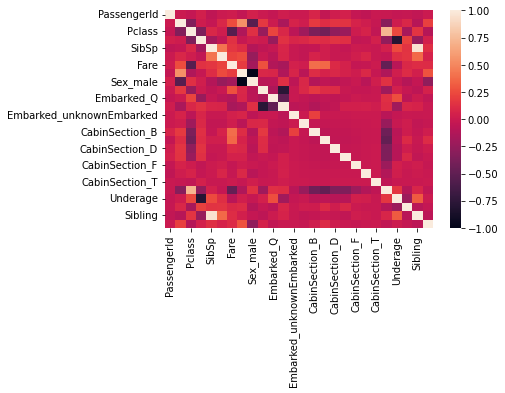

In [51]:
ax = sns.heatmap(correlationTraining)

In [52]:
correlationTest=TestsetFinal.corr(method ='pearson')
correlationTest
#TestsetFinal

,PassengerId,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,...,CabinSection_C,CabinSection_D,CabinSection_E,CabinSection_F,CabinSection_G,CabinSection_U,Underage,Spouse,Sibling,SibSpRest
PassengerId,1.000000,-0.026751,-0.027115,0.003818,0.043080,0.008921,-0.023245,0.023245,-0.027419,-0.035731,...,-0.010701,0.019131,0.023426,0.022429,-0.037134,-0.006462,0.025283,-0.007149,-0.000921,0.030381
Pclass,-0.026751,1.000000,-0.513223,0.001087,0.018721,-0.577673,-0.108615,0.108615,-0.318543,0.252608,...,-0.454994,-0.236878,-0.223270,0.018183,0.042775,0.690579,0.335772,-0.223636,0.096800,-0.094315
Age,-0.027115,-0.513223,1.000000,-0.004321,-0.025037,0.362190,0.053715,-0.053715,0.125474,-0.200494,...,0.304116,0.113621,0.083076,-0.027667,-0.064197,-0.404464,-0.791168,0.240985,-0.096442,0.086462
SibSp,0.003818,0.001087,-0.004321,1.000000,0.306895,0.172167,0.099943,-0.099943,-0.016365,-0.098824,...,0.099729,-0.012552,-0.000484,-0.030780,0.030214,-0.073067,0.111414,0.144352,0.887837,0.290391
Parch,0.043080,0.018721,-0.025037,0.306895,1.000000,0.230501,0.159120,-0.159120,-0.005791,-0.132948,...,-0.024072,-0.043590,0.041513,0.015341,0.030356,-0.037237,0.138885,0.074013,0.270059,0.097574
Fare,0.008921,-0.577673,0.362190,0.172167,0.230501,1.000000,0.192444,-0.192444,0.312756,-0.154926,...,0.463145,0.021542,0.131271,-0.046226,-0.016536,-0.561189,-0.175946,0.286266,0.083672,0.046970
Sex_female,-0.023245,-0.108615,0.053715,0.099943,0.159120,0.192444,1.000000,-1.000000,0.033684,0.115574,...,0.112625,0.007813,0.024919,0.003300,0.064781,-0.131464,-0.045220,0.102955,-0.003190,0.218172
Sex_male,0.023245,0.108615,-0.053715,-0.099943,-0.159120,-0.192444,-1.000000,1.000000,-0.033684,-0.115574,...,-0.112625,-0.007813,-0.024919,-0.003300,-0.064781,0.131464,0.045220,-0.102955,0.003190,-0.218172
Embarked_C,-0.027419,-0.318543,0.125474,-0.016365,-0.005791,0.312756,0.033684,-0.033684,1.000000,-0.199786,...,0.230440,0.122822,0.145972,0.001945,-0.027822,-0.361643,-0.048329,0.068107,-0.056007,0.051668
Embarked_Q,-0.035731,0.252608,-0.200494,-0.098824,-0.132948,-0.154926,0.115574,-0.115574,-0.199786,1.000000,...,-0.078703,-0.063002,-0.052164,-0.049120,-0.017220,0.166981,0.199859,-0.088691,-0.043831,-0.092381


In [53]:
TestsetFinal["Embarked_unknownEmbarked"]=0
TestsetFinal["CabinSection_T"]=0
#TestsetFinal["Embarked_unknownEmbarked"]=0

In [54]:
print((trainingset.columns))

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Age', 'SibSp', 'Parch',
       'Ticket', 'Fare', 'Cabin', 'Sex_female', 'Sex_male', 'Embarked_C',
       'Embarked_Q', 'Embarked_S', 'Embarked_unknownEmbarked',
       'CabinSection_A', 'CabinSection_B', 'CabinSection_C', 'CabinSection_D',
       'CabinSection_E', 'CabinSection_F', 'CabinSection_G', 'CabinSection_T',
       'CabinSection_U', 'surname', 'Underage', 'Spouse', 'Sibling',
       'SibSpRest'],
      dtype='object')


In [55]:
print((TestsetFinal.columns))

Index(['PassengerId', 'Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Sex_female',
       'Sex_male', 'Embarked_C', 'Embarked_Q', 'Embarked_S', 'CabinSection_A',
       'CabinSection_B', 'CabinSection_C', 'CabinSection_D', 'CabinSection_E',
       'CabinSection_F', 'CabinSection_G', 'CabinSection_U', 'Underage',
       'Spouse', 'Sibling', 'SibSpRest', 'Embarked_unknownEmbarked',
       'CabinSection_T'],
      dtype='object')


In [56]:
# define metrics
def Recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def Precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def F1(y_true, y_pred):
    precision = Precision(y_true, y_pred)
    recall = Recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

n_features = 25
model = models.Sequential(name="DeepNN", layers=[
    ### (layer input) & hidden layer 1
    layers.Dense(name="h1", input_dim=n_features, units=int(round((n_features+1)/2)), activation='relu'),
    layers.Dropout(name="drop1", rate=0.2),
    ### hidden layer 2
    layers.Dense(name="h2", units=int(round((n_features+1)/4)), activation='relu'),
    layers.Dropout(name="drop2", rate=0.2),
    ### layer output
    layers.Dense(name="output", units=1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy',F1])

model.summary()

Model: "DeepNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 h1 (Dense)                  (None, 13)                338       
                                                                 
 drop1 (Dropout)             (None, 13)                0         
                                                                 
 h2 (Dense)                  (None, 6)                 84        
                                                                 
 drop2 (Dropout)             (None, 6)                 0         
                                                                 
 output (Dense)              (None, 1)                 7         
                                                                 
Total params: 429
Trainable params: 429
Non-trainable params: 0
_________________________________________________________________


In [57]:

# compile the neural network
model.compile(optimizer='adam', loss='binary_crossentropy', 
              metrics=['accuracy',F1])

In [58]:
'''
Extract info for each layer in a keras model.
'''
def utils_nn_config(model):
    lst_layers = []
    if "Sequential" in str(model): #-> Sequential doesn't show the input layer
        layer = model.layers[0]
        lst_layers.append({"name":"input", "in":int(layer.input.shape[-1]), "neurons":0, 
                           "out":int(layer.input.shape[-1]), "activation":None,
                           "params":0, "bias":0})
    for layer in model.layers:
        try:
            dic_layer = {"name":layer.name, "in":int(layer.input.shape[-1]), "neurons":layer.units, 
                         "out":int(layer.output.shape[-1]), "activation":layer.get_config()["activation"],
                         "params":layer.get_weights()[0], "bias":layer.get_weights()[1]}
        except:
            dic_layer = {"name":layer.name, "in":int(layer.input.shape[-1]), "neurons":0, 
                         "out":int(layer.output.shape[-1]), "activation":None,
                         "params":0, "bias":0}
        lst_layers.append(dic_layer)
    return lst_layers



'''
Plot the structure of a keras neural network.
'''
def visualize_nn(model, description=False, figsize=(10,8)):
    ## get layers info
    lst_layers = utils_nn_config(model)
    layer_sizes = [layer["out"] for layer in lst_layers]
    
    ## fig setup
    fig = plt.figure(figsize=figsize)
    ax = fig.gca()
    ax.set(title=model.name)
    ax.axis('off')
    left, right, bottom, top = 0.1, 0.9, 0.1, 0.9
    x_space = (right-left) / float(len(layer_sizes)-1)
    y_space = (top-bottom) / float(max(layer_sizes))
    p = 0.025
    
    ## nodes
    for i,n in enumerate(layer_sizes):
        top_on_layer = y_space*(n-1)/2.0 + (top+bottom)/2.0
        layer = lst_layers[i]
        color = "green" if i in [0, len(layer_sizes)-1] else "blue"
        color = "red" if (layer['neurons'] == 0) and (i > 0) else color
        
        ### add description
        if (description is True):
            d = i if i == 0 else i-0.5
            if layer['activation'] is None:
                plt.text(x=left+d*x_space, y=top, fontsize=10, color=color, s=layer["name"].upper())
            else:
                plt.text(x=left+d*x_space, y=top, fontsize=10, color=color, s=layer["name"].upper())
                plt.text(x=left+d*x_space, y=top-p, fontsize=10, color=color, s=layer['activation']+" (")
                plt.text(x=left+d*x_space, y=top-2*p, fontsize=10, color=color, s="Σ"+str(layer['in'])+"[X*w]+b")
                out = " Y"  if i == len(layer_sizes)-1 else " out"
                plt.text(x=left+d*x_space, y=top-3*p, fontsize=10, color=color, s=") = "+str(layer['neurons'])+out)
        
        ### circles
        for m in range(n):
            color = "limegreen" if color == "green" else color
            circle = plt.Circle(xy=(left+i*x_space, top_on_layer-m*y_space-4*p), radius=y_space/4.0, color=color, ec='k', zorder=4)
            ax.add_artist(circle)
            
            ### add text
            if i == 0:
                plt.text(x=left-4*p, y=top_on_layer-m*y_space-4*p, fontsize=10, s=r'$X_{'+str(m+1)+'}$')
            elif i == len(layer_sizes)-1:
                plt.text(x=right+4*p, y=top_on_layer-m*y_space-4*p, fontsize=10, s=r'$y_{'+str(m+1)+'}$')
            else:
                plt.text(x=left+i*x_space+p, y=top_on_layer-m*y_space+(y_space/8.+0.01*y_space)-4*p, fontsize=10, s=r'$H_{'+str(m+1)+'}$')
    
    ## links
    for i, (n_a, n_b) in enumerate(zip(layer_sizes[:-1], layer_sizes[1:])):
        layer = lst_layers[i+1]
        color = "green" if i == len(layer_sizes)-2 else "blue"
        color = "red" if layer['neurons'] == 0 else color
        layer_top_a = y_space*(n_a-1)/2. + (top+bottom)/2. -4*p
        layer_top_b = y_space*(n_b-1)/2. + (top+bottom)/2. -4*p
        for m in range(n_a):
            for o in range(n_b):
                line = plt.Line2D([i*x_space+left, (i+1)*x_space+left], 
                                  [layer_top_a-m*y_space, layer_top_b-o*y_space], 
                                  c=color, alpha=0.5)
                if layer['activation'] is None:
                    if o == m:
                        ax.add_artist(line)
                else:
                    ax.add_artist(line)
    plt.show()

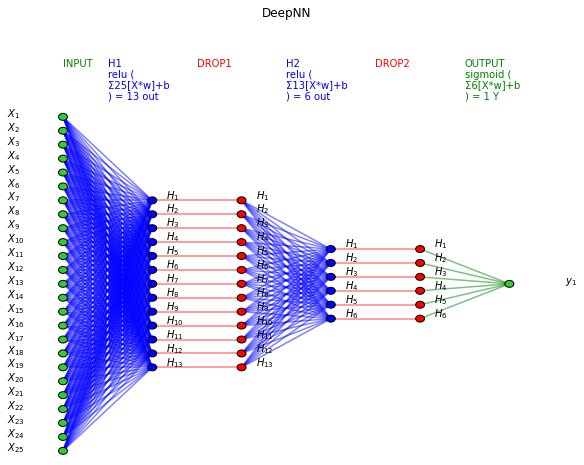

In [59]:
visualize_nn(model, description=True, figsize=(10,8))


In [60]:
#utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

In [61]:
#model.compile(optimizer='adam', loss='binary_crossentropy', 
#              metrics=['accuracy',F1])

In [62]:
# define metrics
def R2(y, y_hat):
    ss_res =  K.sum(K.square(y - y_hat)) 
    ss_tot = K.sum(K.square(y - K.mean(y))) 
    return ( 1 - ss_res/(ss_tot + K.epsilon()) )

# compile the neural network
model.compile(optimizer='adam', loss='mean_absolute_error', 
              metrics=[R2])

In [63]:
# train/validation
#trainingsetFinal=trainingset.drop(columns=['Name', 'Ticket',"Cabin","surname"])

Xtrain=trainingsetFinal.drop(columns=["Survived"])
Ytrain=trainingsetFinal["Survived"]
X_test = TestsetFinal
#training = model.fit(x=Xtrain, y=Ytrain, batch_size=32, epochs=100, shuffle=True, verbose=0, validation_split=0.3)
#model, predicted_prob, predicted = fit_dl_classif(X_train, y_train, X_test, model, 
#                                                  batch_size=32, epochs=100, threshold=0.5)
# plot
#metrics = [k for k in training.history.keys() if ("loss" not in k) and ("val" not in k)]    
#fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,3))
#predicted_prob = model.predict_proba(X_test)[:,1]
      
## training    
#ax[0].set(title="Training")    
#ax11 = ax[0].twinx()    
#ax[0].plot(training.history['loss'], color='black')    
#ax[0].set_xlabel('Epochs')    
#ax[0].set_ylabel('Loss', color='black')    
#for metric in metrics:        
#    ax11.plot(training.history[metric], label=metric)    
#    ax11.set_ylabel("Score", color='steelblue')    
#ax11.legend()
        
## validation    
#ax[1].set(title="Validation")    
#ax22 = ax[1].twinx()    
#ax[1].plot(training.history['val_loss'], color='black')    
#ax[1].set_xlabel('Epochs')    
#ax[1].set_ylabel('Loss', color='black')    
#for metric in metrics:          
#    ax22.plot(training.history['val_'+metric], label=metric)    
#    ax22.set_ylabel("Score", color="steelblue")    
#plt.show()

In [64]:
print(len(trainingset.columns))

30


In [65]:
#evaluate_classif_model(y_test, predicted, predicted_prob, figsize=(25,5))
#predicted = model.predict(X_test)

In [66]:
#display (predicted)

In [67]:
#np.argmax(predicted[0])

In [68]:
TestsetFinal.isnull().sum().sum()
len(TestsetFinal)

418

In [69]:
TestsetFinal['Fare'].isnull().sum().sum()


0

In [70]:

def evaluate_classif_model(y_test, predicted, predicted_prob, show_thresholds=True, figsize=(25,5)):
    classes = np.unique(y_test)
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=figsize)
    
    ## Accuray e AUC
    accuracy = metrics.accuracy_score(y_test, predicted)
    auc = metrics.roc_auc_score(y_test, predicted_prob)
    print("Accuracy (overall correct predictions):",  round(accuracy,2))
    print("Auc:", round(auc,2))
    
    ## Precision e Recall
    recall = metrics.recall_score(y_test, predicted)  #= true 1s / all 1s in test (got and missed)
    precision = metrics.precision_score(y_test, predicted)  #= true 1s / all 1s predicted (true 1s + false 1s)
    f1 = metrics.f1_score(y_test, predicted)  #=2 * (precision * recall) / (precision + recall)
    print("Recall (all 1s predicted right):", round(recall,2))  #true positive rate, how many 1s I got
    print("Precision (confidence when predicting a 1):", round(precision,2))  #how many 1s were really 1s
    print("F1 score:", round(f1,2))
    print("Detail:")
    print(metrics.classification_report(y_test, predicted, target_names=[str(i) for i in classes]))
       
    ## Plot confusion matrix
    cm = metrics.confusion_matrix(y_test, predicted, labels=classes)
    sns.heatmap(cm, annot=True, annot_kws={"size":15}, fmt='d', ax=ax[0], cmap=plt.cm.Blues, cbar=False)
    ax[0].set(xlabel="Pred", ylabel="True", title="Confusion matrix")
    ax[0].set_yticklabels(labels=classes, rotation=0)
 
    ## Plot roc
    fpr, tpr, thresholds = metrics.roc_curve(y_test, predicted_prob)    
    ax[1].plot(fpr, tpr, color='darkorange', lw=3, label='area = %0.2f' % metrics.auc(fpr, tpr))
    ax[1].plot([0,1], [0,1], color='navy', lw=3, linestyle='--')
    ax[1].hlines(y=recall, xmin=-0.05, xmax=1-cm[0,0]/(cm[0,0]+cm[0,1]), color='red', linestyle='--', alpha=0.7, label="chosen threshold")
    ax[1].vlines(x=1-cm[0,0]/(cm[0,0]+cm[0,1]), ymin=0, ymax=recall, color='red', linestyle='--', alpha=0.7)
    ax[1].set(xlim=[-0.05,1], ylim=[0.0,1.05], xlabel='False Positive Rate', ylabel="True Positive Rate (Recall)", title="Receiver operating characteristic")     
    ax[1].legend(loc="lower right")
    ax[1].grid(True)
    if show_thresholds is True:
        thres_in_plot = []
        for i,t in enumerate(thresholds):
            t = np.round(t,1)
            if t not in thres_in_plot:
                ax[1].annotate(t, xy=(fpr[i],tpr[i]), xytext=(fpr[i],tpr[i]), textcoords='offset points', ha='left', va='bottom')
                thres_in_plot.append(t)
    
    ## Plot precision-recall curve
    precisions, recalls, thresholds = metrics.precision_recall_curve(y_test, predicted_prob)
    ax[2].plot(recalls, precisions, color='darkorange', lw=3, label='area = %0.2f' % metrics.auc(recalls, precisions))
    ax[2].plot([0,1], [(cm[1,0]+cm[1,0])/len(y_test), (cm[1,0]+cm[1,0])/len(y_test)], linestyle='--', color='navy', lw=3)
    ax[2].hlines(y=precision, xmin=0, xmax=recall, color='red', linestyle='--', alpha=0.7, label="chosen threshold")
    ax[2].vlines(x=recall, ymin=0, ymax=precision, color='red', linestyle='--', alpha=0.7)
    ax[2].set(xlim=[0.0,1.05], ylim=[0.0,1.05], xlabel='Recall', ylabel="Precision", title="Precision-Recall curve")
    ax[2].legend(loc="lower left")
    ax[2].grid(True)
    if show_thresholds is True:
        thres_in_plot = []
        for i,t in enumerate(thresholds):
            t = np.round(t,1)
            if t not in thres_in_plot:
                ax[2].annotate(np.round(t,1), xy=(recalls[i],precisions[i]), xytext=(recalls[i],precisions[i]), textcoords='offset points', ha='right', va='bottom')
                thres_in_plot.append(t)

    plt.show()

In [71]:
#model, predicted_prob, predicted = fit_dl_classif(Xtrain, Ytrain, X_test, model, 
#                                                  batch_size=32, epochs=100, threshold=0.5)

In [83]:
#y_test = Ytrain.values
training = model.fit(x=Xtrain, y=Ytrain, batch_size=32, epochs=100, shuffle=True,verbose=0, validation_split=0.3)
predicted_prob = training.model.predict(X_test)
predicted = (predicted_prob > 0.5)
#evaluate_classif_model(y_test, predicted, predicted_prob, figsize=(25,5))

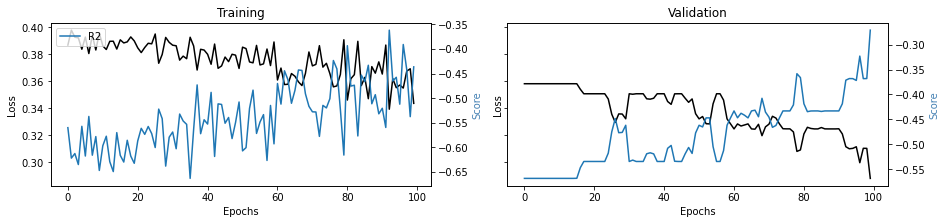

In [84]:
metrics = [k for k in training.history.keys() if ("loss" not in k) and ("val" not in k)]    
fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,3))
#training
ax[0].set(title="Training")    
ax11 = ax[0].twinx()    
ax[0].plot(training.history['loss'], color='black')    
ax[0].set_xlabel('Epochs')    
ax[0].set_ylabel('Loss', color='black')    
for metric in metrics:        
    ax11.plot(training.history[metric], label=metric)    
    ax11.set_ylabel("Score", color='steelblue')    
ax11.legend()
#validation
ax[1].set(title="Validation")    
ax22 = ax[1].twinx()    
ax[1].plot(training.history['val_loss'], color='black')    
ax[1].set_xlabel('Epochs')    
ax[1].set_ylabel('Loss', color='black')    
for metric in metrics:          
    ax22.plot(training.history['val_'+metric], label=metric)    
    ax22.set_ylabel("Score", color="steelblue")    
plt.show()

In [85]:
#

In [86]:
display (predicted)

array([[False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [

In [87]:
display(predicted_prob)

array([[4.53462759e-35],
       [9.04881403e-36],
       [2.80584206e-38],
       [1.21008993e-34],
       [2.61118461e-31],
       [1.37064221e-33],
       [2.15720420e-32],
       [7.96127619e-29],
       [3.55349756e-31],
       [8.74410398e-32],
       [5.30733231e-32],
       [7.69397934e-33],
       [9.95530784e-01],
       [3.65237122e-36],
       [3.62589341e-16],
       [1.61054592e-24],
       [1.78161494e-34],
       [1.47388131e-34],
       [2.06867463e-33],
       [5.90800017e-35],
       [7.58311856e-23],
       [4.92379399e-35],
       [2.55458339e-15],
       [8.20161161e-10],
       [1.00000000e+00],
       [3.23252584e-37],
       [1.93596952e-05],
       [4.85645274e-35],
       [9.27409677e-32],
       [1.39149816e-27],
       [1.39694474e-34],
       [1.09473798e-30],
       [1.64651423e-31],
       [5.23381367e-22],
       [5.51098925e-17],
       [5.68136509e-35],
       [4.20223518e-28],
       [1.04003281e-32],
       [1.68647021e-35],
       [2.59343924e-09],


In [77]:
len(predicted)

418

In [78]:
#dataframe["PassengerId"]= TestsetFinal["PassengerId"]

In [79]:
#display(dataframe)

In [80]:
#result=[]
#for row in predicted:
    #value = SiblingOrNot(row)
    
#    if row==True:
 #       result.append(1)
#    else:
  #      result.append(0)
  #  dataframe["Sibling"] = result
#dataframe["Survived"]= predicted
#display(dataframe)

In [81]:
#display(dataframe)

In [82]:
#corr =corr_matrix(Trainingset, method="pearson", negative=False, figsize=(15,1))
#trainingset.corr(method ='pearson')
